In [1]:
#importing libraries

import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
plt.style.use ('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams ['figure.figsize'] = (12,8) #adjusts configuration of the plot

# reading the data

df = pd.read_csv (r'C:\Users\Shravan\Desktop\Python2023\movies.csv')

In [2]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [3]:
#identifying missing data

for col in df.columns:
    pmiss = np.mean(df [col].isnull())
    print ('{} - {}%'.format (col, round(pmiss*100)))

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [4]:
#data types of columns

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [5]:
#removing the unwanted decimal in the budget and gross section
#encountered error w.r.t infinte values being converted so need to convert infinte values to NaN and then drop those values

df ['budget'] = df['budget'].replace([np.inf, -np.inf], np.nan)

df ['gross'] = df['gross'].replace([np.inf, -np.inf], np.nan)

df ['votes'] = df['votes'].replace([np.inf, -np.inf], np.nan)

#assigning NaN values to inf by dropping rows

df = df.dropna (subset = ['budget', 'gross','votes'])

#assigning data types

df ['budget'] = df ['budget'].astype ('int64')
df ['gross'] = df ['gross'].astype ('int64')
df ['votes'] = df ['votes'].astype ('int64')

df


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020 (United States)",6.6,140000,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124.0
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020 (United States)",6.5,102000,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99.0
7650,Dolittle,PG,Adventure,2020,"January 17, 2020 (United States)",5.6,53000,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101.0
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020 (United States)",6.8,42000,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100.0


In [7]:
# Extract year 
df['Release_Year'] = pd.to_datetime(df['released'].str.extract(r'(\w+ \d{1,2}, \d{4})')[0], format='%B %d, %Y').dt.year

df ['Release_Year'] = df['Release_Year'].replace([np.inf, -np.inf], np.nan)
df = df.dropna (subset = ['Release_Year'])
df.loc[:,'Release_Year'] = df['Release_Year'].astype('int64')

df.head()

C:\Users\Shravan\AppData\Local\Temp\ipykernel_30504\3793723726.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:,'Release_Year'] = df['Release_Year'].astype('int64')
C:\Users\Shravan\AppData\Local\Temp\ipykernel_30504\3793723726.py:6: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df.loc[:,'Release_Year'] = df['Release_Year'].astype('int64')


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Release_Year
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980


In [8]:
df = df.sort_values(by=['gross'], inplace = False, ascending = False)

In [9]:
pd.set_option('display.max_rows', None)

In [10]:
#removing duplicates

#df['director'].drop_duplicates().sort_values(ascending = True)
df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Release_Year
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,2019


In [11]:
# seeing whether high budget can lead to higher gross revenue
# company and its possibility of having higher gross revenue

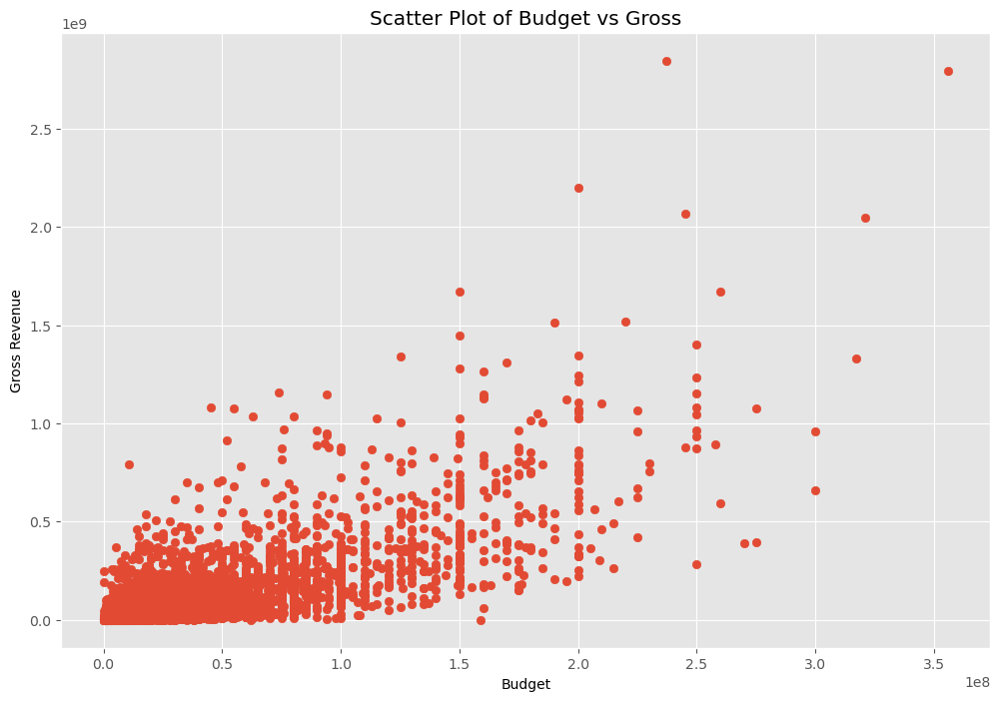

In [12]:
# scatter plot with budget vs gross

plt.scatter(x=df['budget'], y=df['gross'])
plt.xlabel('Budget')
plt.ylabel('Gross Revenue')
plt.title('Scatter Plot of Budget vs Gross')
plt.show()

In [13]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Release_Year
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018


<Axes: xlabel='budget', ylabel='gross'>

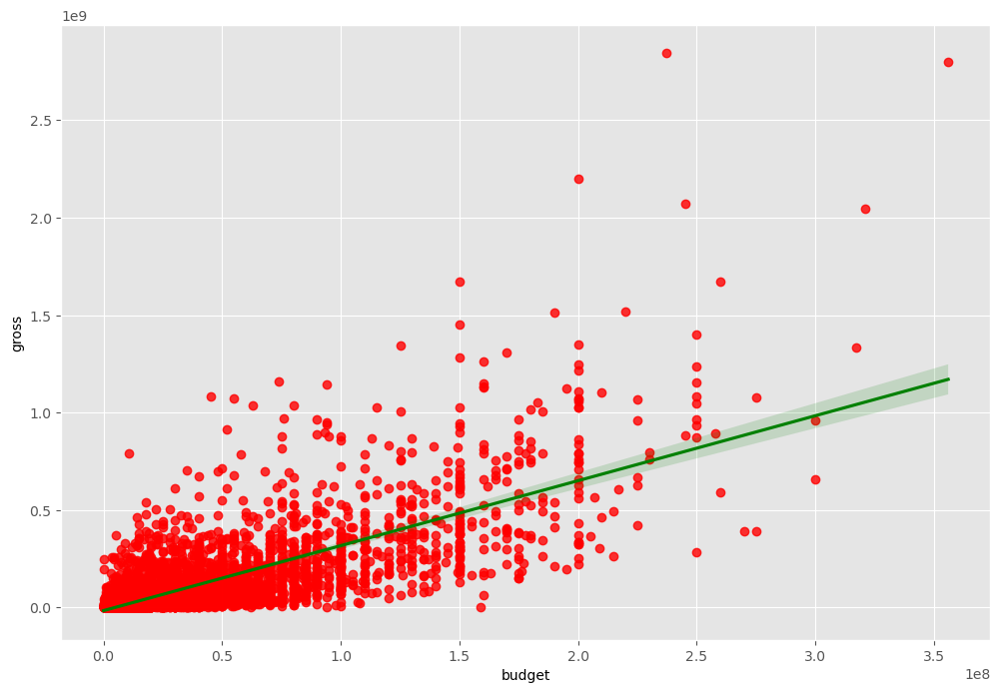

In [14]:
# Seaborn to plot budget and gross revenue

sns.regplot(x='budget', y='gross', data = df, scatter_kws = {"color": "red"}, line_kws = {"color": "green"})

In [15]:
#finding correlations (pearson, kendall,spearman )

df.corr(numeric_only = True) 

,year,score,votes,budget,gross,runtime,Release_Year
year,1.000000,0.054468,0.204646,0.326805,0.273459,0.073973,0.998876
score,0.054468,1.000000,0.474145,0.071344,0.222090,0.415012,0.060547
votes,0.204646,0.474145,1.000000,0.439426,0.614587,0.352397,0.202004
budget,0.326805,0.071344,0.439426,1.000000,0.740177,0.318254,0.319605
gross,0.273459,0.222090,0.614587,0.740177,1.000000,0.275441,0.268049
runtime,0.073973,0.415012,0.352397,0.318254,0.275441,1.000000,0.074320
Release_Year,0.998876,0.060547,0.202004,0.319605,0.268049,0.074320,1.000000


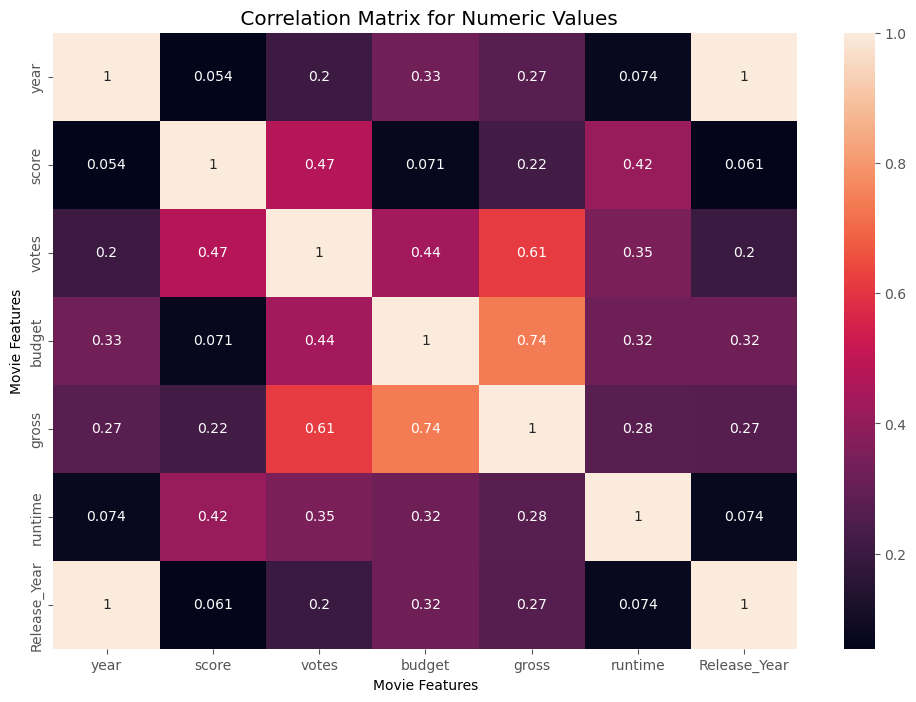

In [16]:
#high correlation between budget and gross

correlation_matrix = df.corr(method = 'pearson',numeric_only = True)

sns.heatmap(correlation_matrix, annot = True)
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.title(' Correlation Matrix for Numeric Values')
plt.show()

In [17]:
df_numerized = df.copy()

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes

df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Release_Year
5445,387,5,0,2009,522,7.8,1100000,783,1262,1531,47,237000000,2847246203,1382,162.0,2009
7445,389,5,0,2019,133,8.4,903000,106,512,1467,47,356000000,2797501328,982,181.0,2019
3045,4909,5,6,1997,529,7.8,1100000,783,1262,1070,47,200000000,2201647264,1382,194.0,1997
6663,3645,5,0,2015,524,7.8,876000,767,1807,356,47,245000000,2069521700,944,138.0,2015
7244,390,5,0,2018,141,8.4,897000,106,512,1467,47,321000000,2048359754,982,149.0,2018
7480,4389,4,2,2019,1123,6.9,222000,1010,1361,455,47,260000000,1670727580,1423,118.0,2019
6653,2118,5,0,2015,1300,7.0,593000,336,2526,293,47,150000000,1670516444,1397,124.0,2015
6043,3879,5,0,2012,1894,8.0,1300000,1058,1647,1467,47,220000000,1518815515,982,143.0,2012
6646,1540,5,0,2015,161,7.1,370000,807,480,1785,47,190000000,1515341399,1397,137.0,2015
7494,1529,4,2,2019,2046,6.8,148000,278,1383,1033,47,150000000,1450026933,1422,103.0,2019


In [18]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Release_Year
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,2019


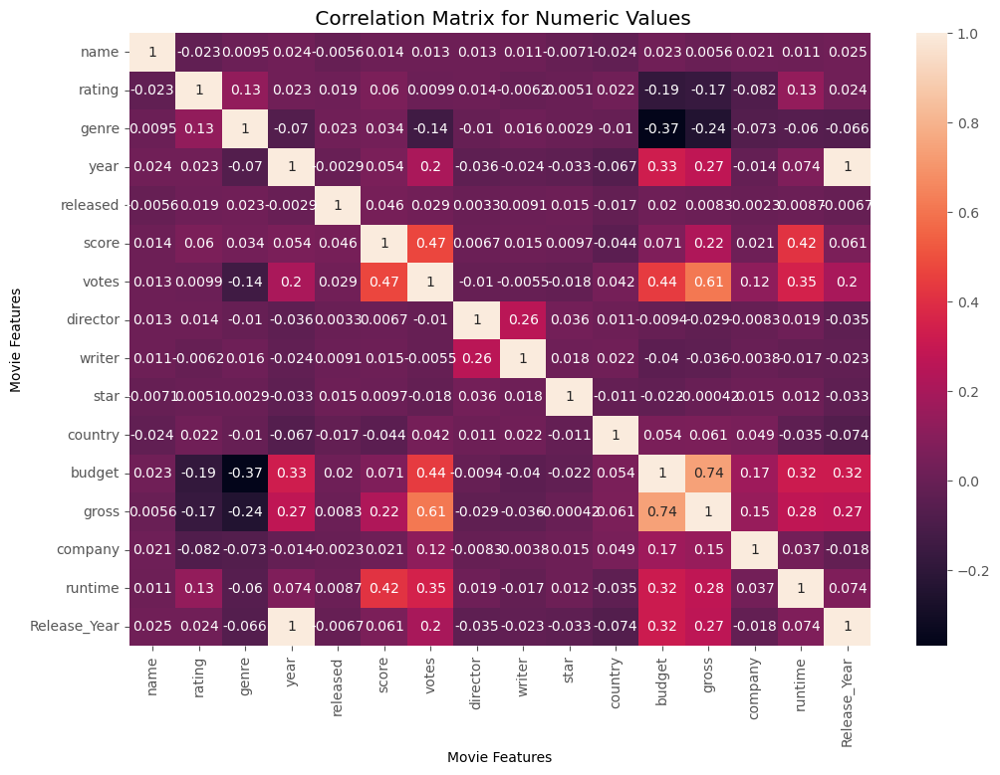

In [19]:
correlation_matrix = df_numerized.corr(method = 'pearson',numeric_only = True)

sns.heatmap(correlation_matrix, annot = True)
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.title(' Correlation Matrix for Numeric Values')
plt.show()

In [20]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Release_Year
name,1.000000,-0.022972,0.009454,0.024005,-0.005587,0.014153,0.012566,0.013140,0.011167,-0.007076,-0.024256,0.023263,0.005608,0.020731,0.011031,0.024678
rating,-0.022972,1.000000,0.128689,0.022954,0.019077,0.060069,0.009877,0.014484,-0.006195,0.005097,0.021779,-0.186440,-0.168598,-0.081933,0.134817,0.023737
genre,0.009454,0.128689,1.000000,-0.069917,0.022890,0.034107,-0.135462,-0.010022,0.016433,0.002876,-0.010316,-0.368610,-0.243831,-0.073021,-0.060103,-0.065767
year,0.024005,0.022954,-0.069917,1.000000,-0.002943,0.054468,0.204646,-0.036192,-0.023513,-0.033142,-0.067040,0.326805,0.273459,-0.014116,0.073973,0.998876
released,-0.005587,0.019077,0.022890,-0.002943,1.000000,0.045754,0.028606,0.003325,0.009061,0.015383,-0.016626,0.019571,0.008289,-0.002269,0.008675,-0.006653
score,0.014153,0.060069,0.034107,0.054468,0.045754,1.000000,0.474145,0.006714,0.014506,0.009714,-0.043766,0.071344,0.222090,0.021202,0.415012,0.060547
votes,0.012566,0.009877,-0.135462,0.204646,0.028606,0.474145,1.000000,-0.010250,-0.005454,-0.017600,0.042008,0.439426,0.614587,0.118620,0.352397,0.202004
director,0.013140,0.014484,-0.010022,-0.036192,0.003325,0.006714,-0.010250,1.000000,0.260842,0.035631,0.011432,-0.009385,-0.029481,-0.008287,0.018806,-0.035182
writer,0.011167,-0.006195,0.016433,-0.023513,0.009061,0.014506,-0.005454,0.260842,1.000000,0.017945,0.021934,-0.039712,-0.036158,-0.003792,-0.016601,-0.022966
star,-0.007076,0.005097,0.002876,-0.033142,0.015383,0.009714,-0.017600,0.035631,0.017945,1.000000,-0.011255,-0.021992,-0.000425,0.014631,0.012090,-0.033425


In [21]:
correlation_mat = df_numerized.corr()

correaltion_pairs = correlation_mat.unstack()

correaltion_pairs

name          name            1.000000
              rating         -0.022972
              genre           0.009454
              year            0.024005
              released       -0.005587
              score           0.014153
              votes           0.012566
              director        0.013140
              writer          0.011167
              star           -0.007076
              country        -0.024256
              budget          0.023263
              gross           0.005608
              company         0.020731
              runtime         0.011031
              Release_Year    0.024678
rating        name           -0.022972
              rating          1.000000
              genre           0.128689
              year            0.022954
              released        0.019077
              score           0.060069
              votes           0.009877
              director        0.014484
              writer         -0.006195
              star       

In [22]:
sorted_pairs = correaltion_pairs.sort_values()
sorted_pairs

budget        genre          -0.368610
genre         budget         -0.368610
              gross          -0.243831
gross         genre          -0.243831
rating        budget         -0.186440
budget        rating         -0.186440
gross         rating         -0.168598
rating        gross          -0.168598
votes         genre          -0.135462
genre         votes          -0.135462
company       rating         -0.081933
rating        company        -0.081933
country       Release_Year   -0.074205
Release_Year  country        -0.074205
company       genre          -0.073021
genre         company        -0.073021
year          genre          -0.069917
genre         year           -0.069917
year          country        -0.067040
country       year           -0.067040
Release_Year  genre          -0.065767
genre         Release_Year   -0.065767
              runtime        -0.060103
runtime       genre          -0.060103
score         country        -0.043766
country       score      

In [30]:
high_co = sorted_pairs[(sorted_pairs) > 0.5 ]


#high_co = list(filter(lambda x: x>0.5 and x<1.0, sorted_pairs))
high_co


# votes and budget have the highest correlation to gross revenue of the movie.

votes         gross           0.614587
gross         votes           0.614587
              budget          0.740177
budget        gross           0.740177
Release_Year  year            0.998876
year          Release_Year    0.998876
name          name            1.000000
company       company         1.000000
gross         gross           1.000000
budget        budget          1.000000
country       country         1.000000
star          star            1.000000
writer        writer          1.000000
director      director        1.000000
votes         votes           1.000000
score         score           1.000000
released      released        1.000000
year          year            1.000000
genre         genre           1.000000
rating        rating          1.000000
runtime       runtime         1.000000
Release_Year  Release_Year    1.000000
dtype: float64